In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms

In [2]:
%pip install torchviz

In [3]:
import os
import random

import pandas as pd
import numpy as np

from PIL import Image
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
from torchviz import make_dot

In [4]:
class ImageTextDataset(torch.utils.data.Dataset):
    def __init__(self, root_dir, csv_file, transform=None):
        self.text_df = pd.read_csv(csv_file)
        self.length = len(self.text_df)
        self.root_dir = root_dir
        self.transform = transform

    def __len__(self):
        return len(self.text_df)

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()

        # Real Images
        img_name = os.path.join(self.root_dir, self.text_df.iloc[idx, 0])
        image = Image.open(img_name)

        true_text = self.text_df.iloc[idx, 1:].values[0]

        if self.transform:
            true_image = self.transform(image)

        # Wrong Images
        wrong_idx = random.randint(0, self.length - 1)
        while wrong_idx == idx:
            # To get a different index incase it is same
            wrong_idx = random.randint(0, self.length - 1)
        wrong_img_name = os.path.join(self.root_dir, self.text_df.iloc[wrong_idx, 0])
        wrong_image = Image.open(wrong_img_name)

        if self.transform:
            wrong_image = self.transform(wrong_image)

        return true_image, true_text, wrong_image


def process_data(attribute_csv_path):
    # Read from csv files
    attributes_df = pd.read_csv(attribute_csv_path)

    # Drop columns
    drop_cols = {"Bags_Under_Eyes", "Bangs", "Blurry", "No_Beard"}
    attributes_df = attributes_df.drop(columns=drop_cols)
    only_attributes = attributes_df.drop(columns="image_id")
    classes = set(only_attributes)
    print("Classes present: ", classes)
    print("Number of classes: ", len(classes))

    return only_attributes, classes


def generate_weights(arr, num_classes):

    # To get the count of each label
    counts = np.zeros(num_classes)
    for row in tqdm(arr):
        idxs = np.where(row == 1)
        counts[idxs] += 1

    # Calculating weight per class
    N = float(sum(counts))
    weight_per_class = np.zeros(num_classes)
    for i in range(num_classes):
        weight_per_class[i] = N / counts[i]

    # Calculating final weights
    weights = [0.0] * len(arr)
    for i, row in tqdm(enumerate(arr)):
        idxs = np.where(row == 1)
        weights[i] = sum(weight_per_class[idxs])
    return weights


def get_weighted_dataloader(
    attribute_csv_path,
    custom_dataset=None,
    image_location=None,
    text_desc_location=None,
    transform=None,
    subset_size=10000,
    batch_size=64,
):

    # Get random indices
    random_indices = torch.randperm(subset_size)
    print("Length of random indices:", len(random_indices))

    only_attributes, classes = process_data(attribute_csv_path)

    only_attributes = only_attributes.iloc[random_indices]
    print("Length of subset dataset:", len(only_attributes))

    # Generate weights
    weights = generate_weights(only_attributes.values, len(classes))

    # Sample based on weights
    sampler = torch.utils.data.sampler.WeightedRandomSampler(weights, len(weights))

    # Create dataset
    if custom_dataset is not None:
        print("Using Custom Dataset Loader...")
        dataset = custom_dataset
    else:
        if image_location is None:
            raise NotImplementedError("Image directory not specified")
        if text_desc_location is None:
            raise NotImplementedError("Text path not specified")
        print("Using ImageTextDataset loader...")
        dataset = ImageTextDataset(
            image_location, text_desc_location, transform=transform
        )

    # Create subset of dataset
    subset_dataset = torch.utils.data.Subset(dataset, random_indices)

    # Create weighted loader
    weighted_dataloader = torch.utils.data.DataLoader(
        subset_dataset,
        batch_size=batch_size,
        shuffle=False,
        sampler=sampler,
        pin_memory=True,
    )

    return weighted_dataloader, iter(weighted_dataloader)

In [5]:
768 * 768

589824

In [6]:
pip install sentence-transformers


Note: you may need to restart the kernel to use updated packages.


In [7]:
from sentence_transformers import SentenceTransformer


class SentenceEncoder:
    def __init__(self, device):
        self.bert_model = SentenceTransformer("all-mpnet-base-v2").to(device)
        self.device = device

    def convert_text_to_embeddings(self, batch_text):
        stack = []
        for sent in batch_text:
            l = sent.split(". ")
            sentence_embeddings = self.bert_model.encode(l)
            sentence_emb = torch.FloatTensor(sentence_embeddings).to(self.device)
            sent_mean = torch.mean(sentence_emb, dim=0).reshape(1, -1)
            stack.append(sent_mean)
        output = torch.cat(stack, dim=0)
        return output.detach()

c:\Users\nunna\anaconda3\envs\dl_env\Lib\site-packages\sentence_transformers\cross_encoder\CrossEncoder.py:11: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm, trange


In [8]:
from dataclasses import dataclass,asdict

@dataclass
class Config:
  epochs: int = 30
  image_size: int = 128
  initial_size: int = 64
  noise_size: int = 100
  batch_size: int = 32
  subset_size: int = 20_000
  num_channels: int = 3
    
  device: 'typing.Any' = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [9]:
cfg = Config()
cfg_dict = asdict(cfg)

In [10]:
print(torch.cuda.is_available())


True


In [11]:
import torch

if torch.cuda.is_available():
    print("CUDA is available! 🎉")
    print("Number of available GPUs:", torch.cuda.device_count())
    print("Current GPU:", torch.cuda.current_device())
    print("GPU name:", torch.cuda.get_device_name(0))
else:
    print("CUDA is not available. 😞")

CUDA is available! 🎉
Number of available GPUs: 1
Current GPU: 0
GPU name: NVIDIA GeForce RTX 3050 Laptop GPU


In [12]:
sentence_encoder = SentenceEncoder(cfg.device)

In [13]:
def show_grid(img):
  npimg = img.numpy()
  plt.imshow(np.transpose(npimg, (1, 2, 0)))
  plt.show()

In [14]:
class ImageNTextDataset(torch.utils.data.Dataset):
    """
    Meant for CelebA Dataset'.
    Pairs True Image, True Text and Wrong Image
    """

    def __init__(self, root_dir, csv_file, transform=None):
        """
        Args:
            root_dir (string): Directory with all the images.
            csv_file (string): Path to the csv file with annotations.
            transform (callable, optional): Optional transform to be applied on a sample.
        """
        self.text_df = pd.read_csv(csv_file)
        self.length = len(self.text_df)
        self.root_dir = root_dir
        self.transform = transform

    def __len__(self):
        return len(self.text_df)

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()

        # Real Images
        img_name = os.path.join(self.root_dir, self.text_df.iloc[idx, 0])
        image = Image.open(img_name)

        true_text = random.choice(self.text_df.iloc[idx, 1:].values[0].split('\n')).strip()

        if self.transform:
            true_image = self.transform(image)

        # Wrong Images
        wrong_idx = random.randint(0, self.length - 1)
        while wrong_idx == idx:
            # To get a different index incase it is same
            wrong_idx = random.randint(0, self.length - 1)
        wrong_img_name = os.path.join(self.root_dir, self.text_df.iloc[wrong_idx, 0])
        wrong_image = Image.open(wrong_img_name)

        if self.transform:
            wrong_image = self.transform(wrong_image)

        return true_image, true_text, wrong_image

In [15]:
dataset = ImageNTextDataset('img_align_celeba/img_align_celeba', 'text_5_descr_celeba.csv', transform=transforms.Compose([transforms.Resize((cfg.image_size, cfg.image_size)), transforms.ToTensor(), transforms.Normalize(mean=(0.5), std=(0.5))]))

In [16]:
weighted_dataloader, weighted_dataiter = get_weighted_dataloader(
    'list_attr_celeba.csv',
    custom_dataset=dataset,
    subset_size=cfg.subset_size,
    batch_size=cfg.batch_size
)

Length of random indices: 20000
Classes present:  {'Narrow_Eyes', 'Arched_Eyebrows', 'Goatee', 'Mustache', 'Rosy_Cheeks', 'Oval_Face', 'Wearing_Earrings', 'Wearing_Necktie', 'Wearing_Necklace', 'Young', 'Gray_Hair', 'Mouth_Slightly_Open', 'Smiling', 'Bushy_Eyebrows', 'Heavy_Makeup', '5_o_Clock_Shadow', 'Attractive', 'Big_Lips', 'Black_Hair', 'Wearing_Lipstick', 'Double_Chin', 'Straight_Hair', 'Male', 'Receding_Hairline', 'Chubby', 'High_Cheekbones', 'Pale_Skin', 'Eyeglasses', 'Wearing_Hat', 'Big_Nose', 'Bald', 'Blond_Hair', 'Brown_Hair', 'Pointy_Nose', 'Sideburns', 'Wavy_Hair'}
Number of classes:  36
Length of subset dataset: 20000


  0%|          | 0/20000 [00:00<?, ?it/s]

0it [00:00, ?it/s]

Using Custom Dataset Loader...


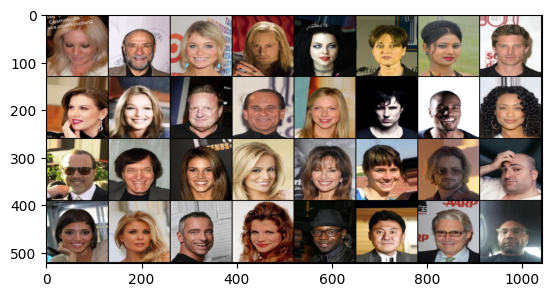

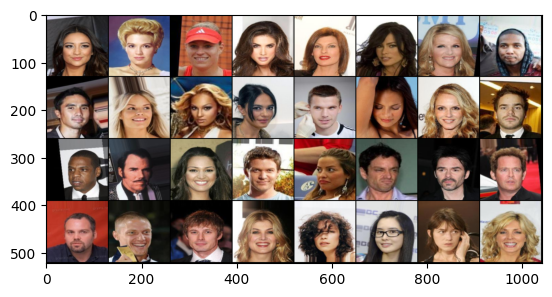

['The woman has high cheekbones. She has blond hair. She has a pointy nose. She is smiling, looks attractive, young and has heavy makeup. She is wearing lipstick.', 'The male has a chubby face and has an oval face. He has sideburns. He is bald. He has a big nose and a slightly open mouth. The male is smiling.', 'The female has pretty high cheekbones and an oval face. She has blond and wavy hair. She has arched eyebrows, a slightly open mouth and a pointy nose. She looks attractive, young, is smiling and has heavy makeup. She is wearing lipstick.', "He sports a 5 o' clock shadow and sports a goatee. He has blond and straight hair. The man looks young.", 'Her hair is black and straight. She has arched eyebrows, big lips and a slightly open mouth. The lady seems attractive, young, has pale skin and heavy makeup. She is wearing lipstick and a necklace.', 'The female has high cheekbones and an oval face. Her hair is straight. She has a slightly open mouth. The lady is smiling and has heavy 

In [17]:
images, labels, wrong_images = next(weighted_dataiter)
show_grid(torchvision.utils.make_grid(images, normalize=True))
show_grid(torchvision.utils.make_grid(wrong_images, normalize=True))
print(labels)

In [18]:
def initialize_weights(model):
    className = model.__class__.__name__
    if className.find('Conv') != -1:
        nn.init.normal_(model.weight.data, 0.0, 0.02)
    elif className.find('BatchNorm') != -1:
        nn.init.normal_(model.weight.data, 1.0, 0.02)
        nn.init.constant_(model.bias.data, 0)

In [19]:
class Generator(nn.Module):
    '''
    The Generator Network
    '''

    def __init__(self, noise_size, feature_size, num_channels, embedding_size, reduced_dim_size):
        super(Generator, self).__init__()
        self.reduced_dim_size = reduced_dim_size

        self.projection = nn.Sequential(
            nn.Linear(in_features = embedding_size, out_features = reduced_dim_size),
            nn.BatchNorm1d(num_features = reduced_dim_size),
            nn.LeakyReLU(negative_slope = 0.2, inplace = True)
        )

        self.layer = nn.Sequential(
            nn.ConvTranspose2d(noise_size + reduced_dim_size, feature_size * 8, 4, 1, 0, bias = False),
            nn.BatchNorm2d(feature_size * 8),
            nn.LeakyReLU(negative_slope = 0.2, inplace = True),

            # state size (ngf*4) x 4 x 4
            nn.ConvTranspose2d(feature_size * 8, feature_size * 4, 4, 2, 1, bias = False),
            nn.BatchNorm2d(feature_size * 4),
            nn.ReLU(True),

            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d(feature_size * 4, feature_size * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(feature_size * 2),
            nn.ReLU(True),

            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d(feature_size * 2, feature_size, 4, 2, 1, bias=False),
            nn.BatchNorm2d(feature_size),
            nn.ReLU(True),

            # state size. (ngf*2) x 32 x 32
            nn.ConvTranspose2d(feature_size, feature_size, 4, 2, 1, bias=False),
            nn.BatchNorm2d(feature_size),
            nn.ReLU(True),

            # state size. (ngf) x 64 x 64
            nn.ConvTranspose2d(feature_size, num_channels, 4, 2, 1, bias=False),
            nn.Tanh()
        )
        self.optimizer = torch.optim.Adam(self.parameters(), lr = 0.0004, betas = (0.5,0.999))

    def forward(self, noise, text_embeddings):
        encoded_text = self.projection(text_embeddings)
        concat_input = torch.cat([noise, encoded_text], dim = 1).unsqueeze(2).unsqueeze(2)
        output = self.layer(concat_input)
        return output

In [20]:
generator = Generator(cfg.noise_size, cfg.image_size, cfg.num_channels, 768, 256)
generator.apply(initialize_weights)
generator.cuda()

Generator(
  (projection): Sequential(
    (0): Linear(in_features=768, out_features=256, bias=True)
    (1): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (layer): Sequential(
    (0): ConvTranspose2d(356, 1024, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
    (3): ConvTranspose2d(1024, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2),

In [21]:
class Discriminator(nn.Module):
    '''
    The Discriminator Network
    '''

    def __init__(self, num_channels, feature_size, embedding_size, reduced_dim_size):
        super(Discriminator, self).__init__()
        self.reduced_dim_size = reduced_dim_size

        ## Image Encoder 
        self.netD_1 = nn.Sequential(
            # input nc x 128 x 128
            nn.Conv2d(num_channels, feature_size, 4, 2, 1, bias = False),
            nn.LeakyReLU(0.2, inplace = True),

            # input nc x 64 x 64
            nn.Conv2d(feature_size, feature_size, 4, 2, 1, bias = False),
            nn.LeakyReLU(0.2, inplace = True),

            # state size ndf x 32 x 32
            nn.Conv2d(feature_size, feature_size * 2, 4, 2, 1, bias = False),
            nn.BatchNorm2d(feature_size * 2),
            nn.LeakyReLU(0.2, inplace = True),

            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(feature_size * 2, feature_size * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(feature_size * 4),
            nn.LeakyReLU(0.2, inplace=True),

            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(feature_size * 4, feature_size * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(feature_size * 8),
            nn.LeakyReLU(0.2, inplace=True),

        )

        ## Text Encoder
        self.projector = nn.Sequential(
            nn.Linear(in_features=embedding_size, out_features=reduced_dim_size),
            nn.BatchNorm1d(num_features=reduced_dim_size),
            nn.LeakyReLU(negative_slope=0.2, inplace=True)
        )

        ## Text + Image Concat Layer
        self.netD_2 = nn.Sequential(
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(feature_size * 8 + reduced_dim_size, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

        self.optimizer = torch.optim.Adam(self.parameters(), lr = 0.0001, betas = (0.5, 0.999))

    def forward(self, input_img, text_embeddings):
        x_intermediate = self.netD_1(input_img)
        
        projected_embed = self.projector(text_embeddings)
        
        replicated_embed = projected_embed.repeat(4, 4, 1, 1).permute(2,  3, 0, 1)
        hidden_concat = torch.cat([x_intermediate, replicated_embed], 1)
        
        x = self.netD_2(hidden_concat)

        return x.view(-1, 1), x_intermediate
    @property
    def size(self):
      return  Discriminator.shape()

In [22]:
class Discriminator(nn.Module):
    '''
    The Discriminator Network
    '''

    def __init__(self, num_channels, feature_size, embedding_size, reduced_dim_size):
        super(Discriminator, self).__init__()
        self.reduced_dim_size = reduced_dim_size

        ## Image Encoder 
        self.netD_1 = nn.Sequential(
            # input nc x 128 x 128
            nn.Conv2d(num_channels, feature_size, 4, 2, 1, bias = False),
            nn.LeakyReLU(0.2, inplace = True),

            # input nc x 64 x 64
            nn.Conv2d(feature_size, feature_size, 4, 2, 1, bias = False),
            nn.LeakyReLU(0.2, inplace = True),

            # state size ndf x 32 x 32
            nn.Conv2d(feature_size, feature_size * 2, 4, 2, 1, bias = False),
            nn.BatchNorm2d(feature_size * 2),
            nn.LeakyReLU(0.2, inplace = True),

            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(feature_size * 2, feature_size * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(feature_size * 4),
            nn.LeakyReLU(0.2, inplace=True),

            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(feature_size * 4, feature_size * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(feature_size * 8),
            nn.LeakyReLU(0.2, inplace=True),

        )

        ## Text Encoder
        self.projector = nn.Sequential(
            nn.Linear(in_features=embedding_size, out_features=reduced_dim_size),
            nn.BatchNorm1d(num_features=reduced_dim_size),
            nn.LeakyReLU(negative_slope=0.2, inplace=True)
        )

        ## Text + Image Concat Layer
        self.netD_2 = nn.Sequential(
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(feature_size * 8 + reduced_dim_size, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

        self.optimizer = torch.optim.Adam(self.parameters(), lr = 0.0002, betas = (0.5, 0.999))

    def forward(self, input_img, text_embeddings):
        x_intermediate = self.netD_1(input_img)
        
        projected_embed = self.projector(text_embeddings)
        
        replicated_embed = projected_embed.repeat(4, 4, 1, 1).permute(2,  3, 0, 1)
        hidden_concat = torch.cat([x_intermediate, replicated_embed], 1)
        
        x = self.netD_2(hidden_concat)

        return x.view(-1, 1), x_intermediate



In [23]:
discriminator = Discriminator(cfg.num_channels, cfg.image_size, 768, 256)
discriminator.apply(initialize_weights)
discriminator.cuda()



from torchviz import make_dot

make_dot(discriminator, params=dict(list(discriminator.named_parameters()))).render("rnn_torchviz", format="png")

AttributeError: 'Discriminator' object has no attribute 'size'

In [24]:
criterion = nn.BCELoss().cuda()
l2_loss = nn.MSELoss().cuda()
l1_loss = nn.L1Loss().cuda()

In [25]:
plt_images, plt_labels, plt_wrong = next(weighted_dataiter)
plt_o_text_embeddings = sentence_encoder.convert_text_to_embeddings(plt_labels)
plt_o_text_embeddings.shape

torch.Size([32, 768])

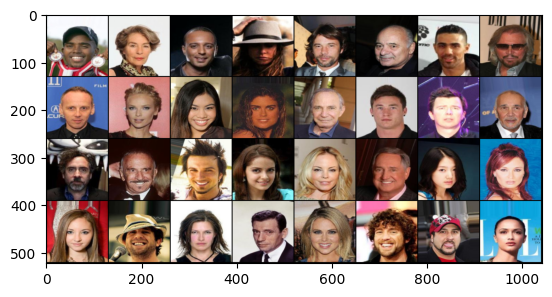

['The gentleman has high cheekbones. He has bushy eyebrows, a slightly open mouth and narrow eyes. He is smiling and is young.', 'Her hair is wavy. She has arched eyebrows and a pointy nose. The lady has heavy makeup. She is wearing lipstick.', 'The gentleman has high cheekbones. His hair is receding. He has big lips and a slightly open mouth. The man looks young and is smiling.', 'He looks young. He is wearing a hat.', 'He has a goatee and has sideburns. He has a big nose. The gentleman seems attractive. He is wearing a necktie.', 'The man has a chubby face, has a double chin and pretty high cheekbones. His hair is receding and he is partially bald. He has a big nose. The gentleman is smiling.', "He wears a 5 o' clock shadow and has sideburns. His hair is black. He has a big nose, bushy eyebrows and a slightly open mouth. The gentleman is young.", 'The man has a chubby face and has an oval face. He has a goatee, has a mustache and has sideburns. He has a big nose. He is wearing eyegla

In [26]:
show_grid(torchvision.utils.make_grid(plt_images.cpu(), normalize=True))
print(plt_labels)

In [27]:
fixed_noise = torch.randn(size=(len(plt_labels), cfg.noise_size)).cuda()

In [28]:
def plot_output(epoch):
  plt.clf()
  with torch.no_grad():

    generator.eval()
    test_images = generator(fixed_noise, plt_o_text_embeddings)
    generator.train()
  
    grid = torchvision.utils.make_grid(test_images.cpu(), normalize=True)
    show_grid(grid)

In [29]:
# Assuming you are within the forward method of the discriminator
def forward(self, x, text_embeddings):
    # ... (previous layers)
    
    x_intermediate = self.netD_1(x)
    
    # Replicate the text embeddings to match the spatial dimensions of x_intermediate
    replicated_embed = text_embeddings.unsqueeze(2).unsqueeze(3)  # Assuming text_embeddings is (batch_size, embed_dim)
    replicated_embed = replicated_embed.repeat(1, 1, x_intermediate.size(2), x_intermediate.size(3))
    
    # Print the shapes to debug
    print(f"x_intermediate shape: {x_intermediate.shape}")
    print(f"replicated_embed shape: {replicated_embed.shape}")
    
    hidden_concat = torch.cat([x_intermediate, replicated_embed], 1)
    
    # ... (subsequent layers)
    return x.view(-1, 1), x_intermediate


0it [00:00, ?it/s]

Epoch:  1 / 30
Discriminator Loss: 2.636, Generator Loss: 29.910


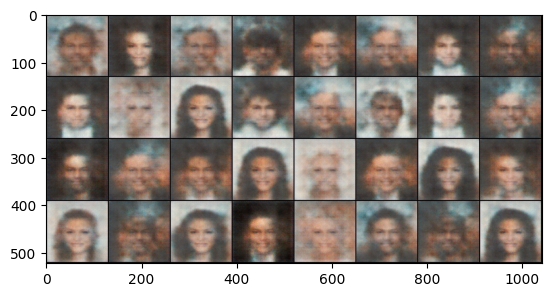

Epoch:  2 / 30
Discriminator Loss: 1.892, Generator Loss: 27.573


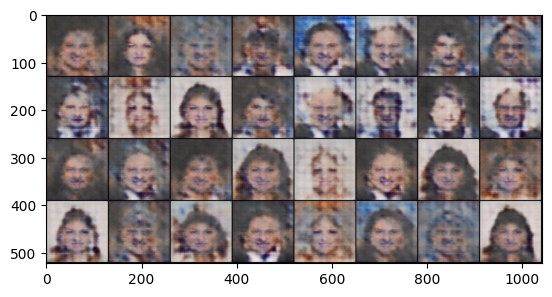

Epoch:  3 / 30
Discriminator Loss: 1.867, Generator Loss: 27.462


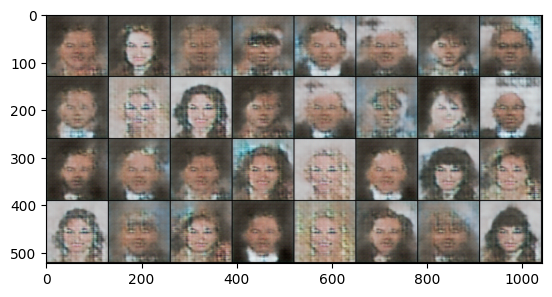

Epoch:  4 / 30
Discriminator Loss: 1.859, Generator Loss: 27.260


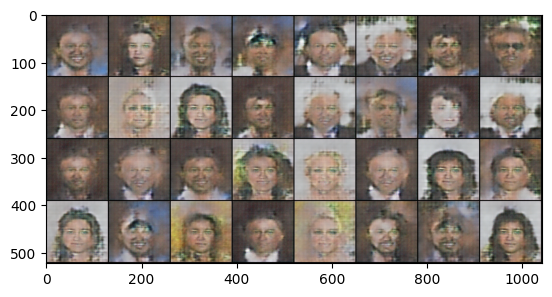

Epoch:  5 / 30
Discriminator Loss: 1.838, Generator Loss: 27.160


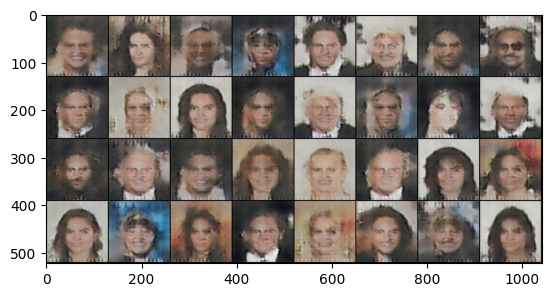

Epoch:  6 / 30
Discriminator Loss: 1.826, Generator Loss: 27.265


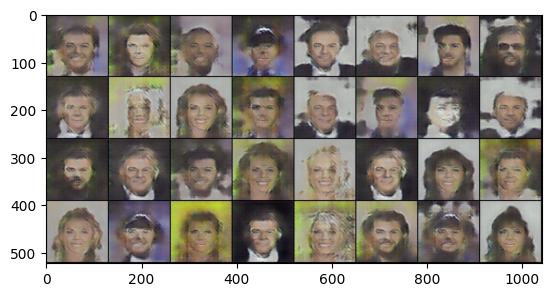

Epoch:  7 / 30
Discriminator Loss: 1.815, Generator Loss: 27.104


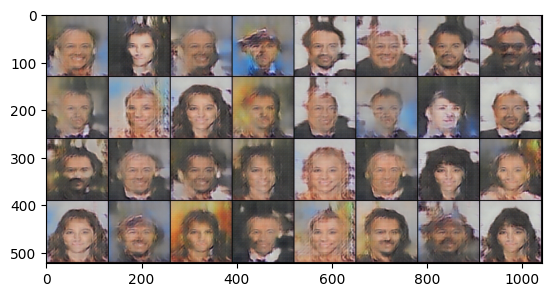

Epoch:  8 / 30
Discriminator Loss: 1.803, Generator Loss: 27.118


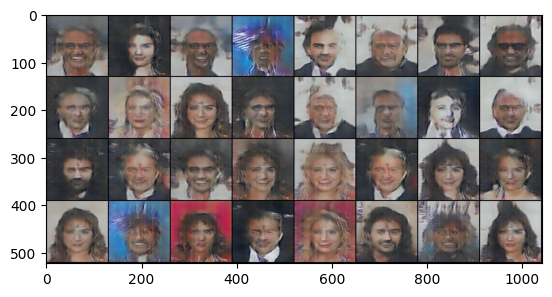

Epoch:  9 / 30
Discriminator Loss: 1.800, Generator Loss: 27.058


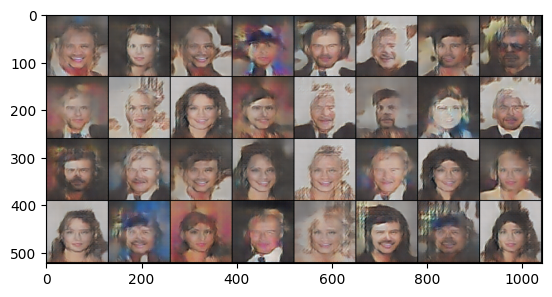

Epoch:  10 / 30
Discriminator Loss: 1.789, Generator Loss: 27.106


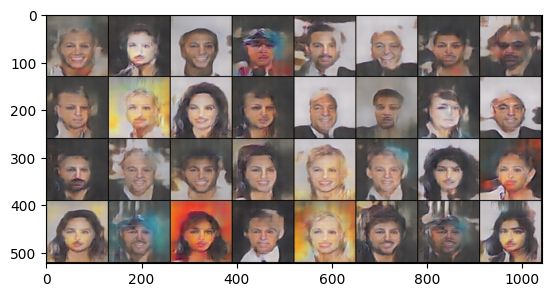

Epoch:  11 / 30
Discriminator Loss: 1.777, Generator Loss: 27.009


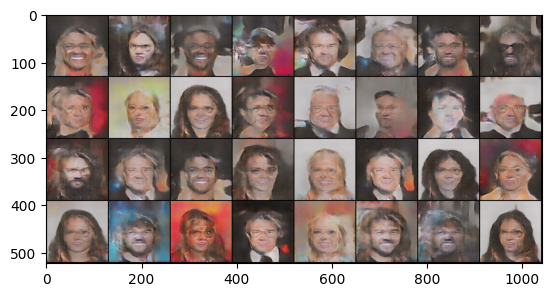

Epoch:  12 / 30
Discriminator Loss: 1.767, Generator Loss: 26.926


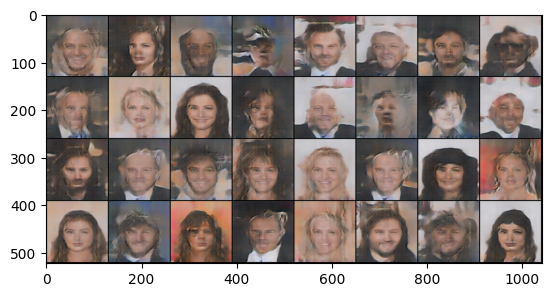

Epoch:  13 / 30
Discriminator Loss: 1.775, Generator Loss: 26.816


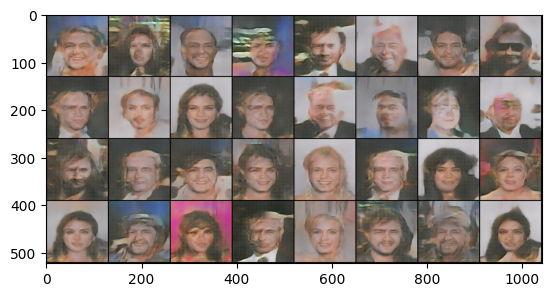

Epoch:  14 / 30
Discriminator Loss: 1.760, Generator Loss: 26.813


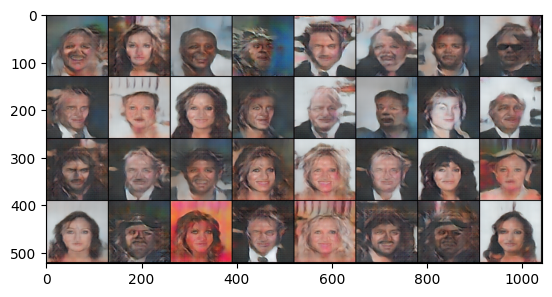

Epoch:  15 / 30
Discriminator Loss: 1.752, Generator Loss: 26.840


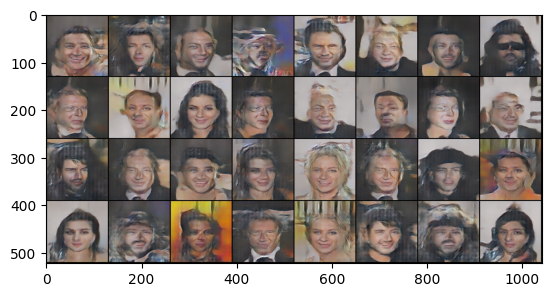

Epoch:  16 / 30
Discriminator Loss: 1.749, Generator Loss: 26.712


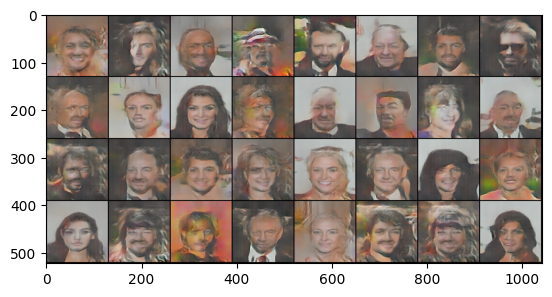

Epoch:  17 / 30
Discriminator Loss: 1.733, Generator Loss: 26.726


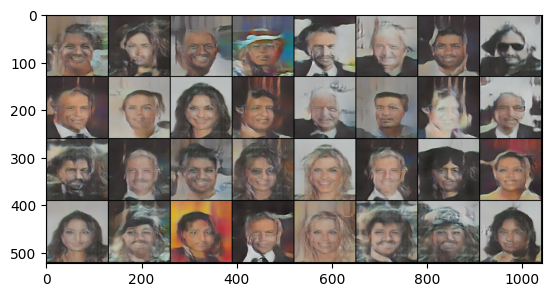

Epoch:  18 / 30
Discriminator Loss: 1.715, Generator Loss: 26.678


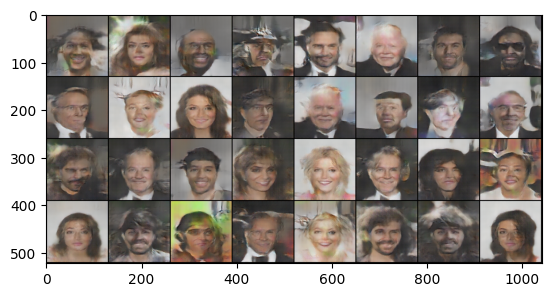

Epoch:  19 / 30
Discriminator Loss: 1.704, Generator Loss: 26.657


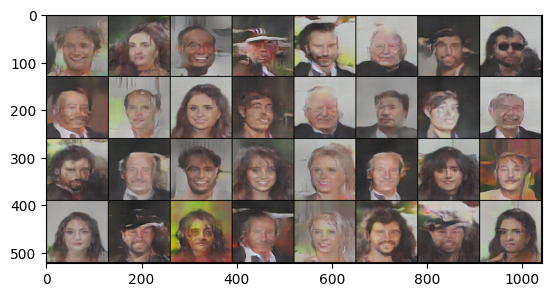

Epoch:  20 / 30
Discriminator Loss: 1.684, Generator Loss: 26.565


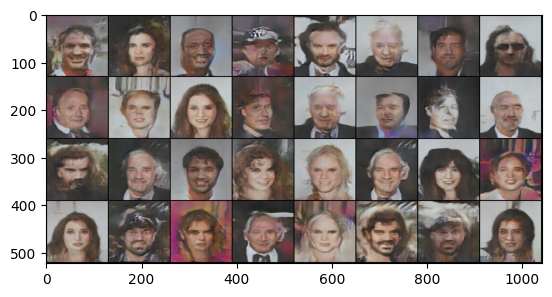

Epoch:  21 / 30
Discriminator Loss: 1.670, Generator Loss: 26.497


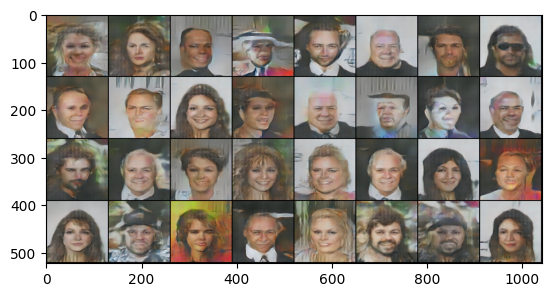

Epoch:  22 / 30
Discriminator Loss: 1.652, Generator Loss: 26.630


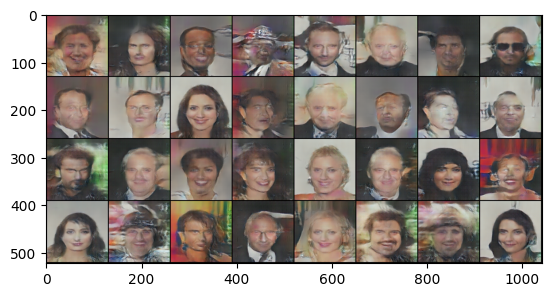

Epoch:  23 / 30
Discriminator Loss: 1.626, Generator Loss: 26.586


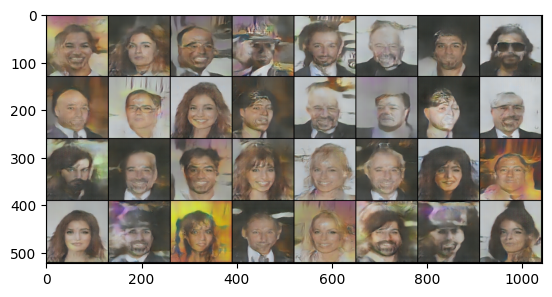

Epoch:  24 / 30
Discriminator Loss: 1.595, Generator Loss: 26.628


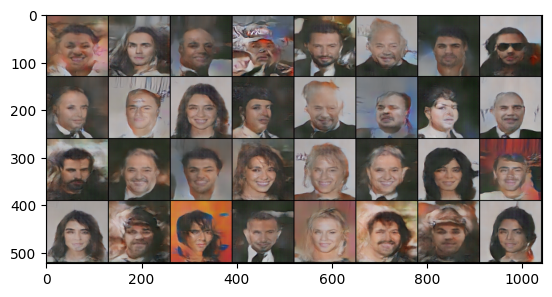

Epoch:  25 / 30
Discriminator Loss: 1.562, Generator Loss: 26.640


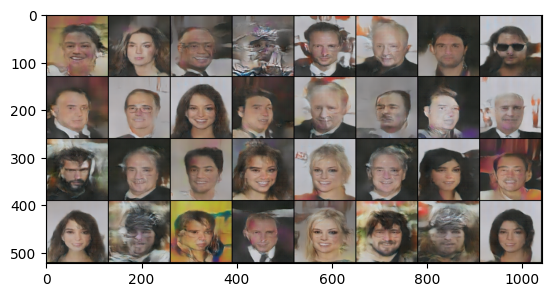

Epoch:  26 / 30
Discriminator Loss: 1.547, Generator Loss: 26.576


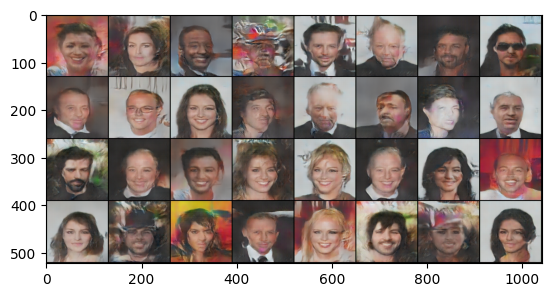

Epoch:  27 / 30
Discriminator Loss: 1.523, Generator Loss: 26.644


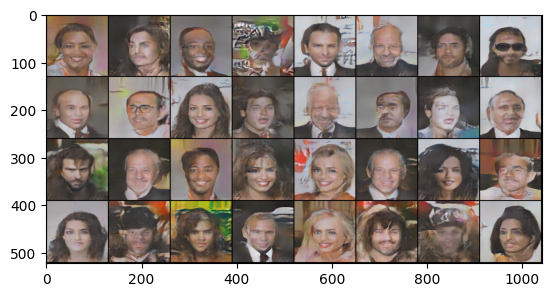

Epoch:  28 / 30
Discriminator Loss: 1.485, Generator Loss: 26.730


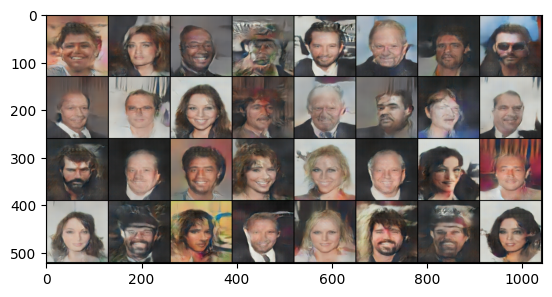

Epoch:  29 / 30
Discriminator Loss: 1.438, Generator Loss: 26.689


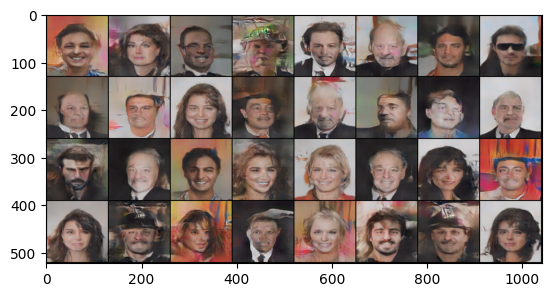

Epoch:  30 / 30
Discriminator Loss: 1.407, Generator Loss: 26.767


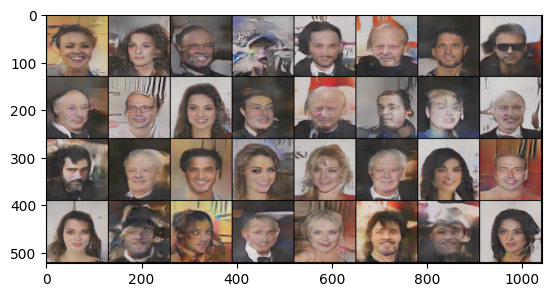

True

In [30]:
pbar = tqdm()

for epoch in range(cfg.epochs):
    print(f'Epoch:  {epoch + 1} / {cfg.epochs}')
    pbar.reset(total = len(weighted_dataloader))

    discriminator_loss = []
    generator_loss = []

    for i, (real_images, real_text, wrong_images) in enumerate(weighted_dataloader):
        current_batch_size = real_images.size()[0]

        #converting to cuda
        real_images = real_images.cuda() #Optional
        text_embeddings = sentence_encoder.convert_text_to_embeddings(real_text)
        wrong_images = wrong_images.cuda() #Optional

        real_validity = torch.ones(current_batch_size, 1).cuda()
        fake_validity = torch.zeros(current_batch_size, 1).cuda()

        temp_tensor = (torch.ones(current_batch_size, 1).cuda()) * (-0.1)    
        smoothed_real_labels = torch.add(real_validity, temp_tensor)

        ## Training the discriminator
        discriminator.zero_grad()
        output, activation_real = discriminator(real_images, text_embeddings)
        real_loss = criterion(output, smoothed_real_labels)
        real_score = output

        output, _ = discriminator(wrong_images, text_embeddings)
        wrong_loss = criterion(output, fake_validity)

        input_noise = torch.randn(size=(current_batch_size, cfg.noise_size)).cuda()
        fake_images = generator(input_noise, text_embeddings)
        output, _ = discriminator(fake_images, text_embeddings)
        fake_loss = criterion(output, fake_validity)

        d_loss = real_loss + wrong_loss + fake_loss

        d_loss.backward()
        discriminator.optimizer.step()
        discriminator_loss.append(d_loss)

        ## Training generator
        generator.zero_grad()
        input_noise = torch.randn(size=(current_batch_size, cfg.noise_size)).cuda()
        fake_images = generator(input_noise, text_embeddings)
        output, activation_fake = discriminator(fake_images, text_embeddings)
        _, activation_real = discriminator(real_images, text_embeddings)

        activation_fake = torch.mean(activation_fake, 0)    #try with median and check if it converges
        activation_real = torch.mean(activation_real, 0)    #try with median and check if it converges

        g_loss = criterion(output, real_validity) + 100 * l2_loss(activation_fake, activation_real.detach()) + 50 * l1_loss(fake_images, real_images)

        g_loss.backward()
        generator.optimizer.step()
        generator_loss.append(g_loss)

        pbar.update()

    print('Discriminator Loss: {:.3f}, Generator Loss: {:.3f}'.format(
          torch.mean(torch.FloatTensor(discriminator_loss)),
          torch.mean(torch.FloatTensor(generator_loss))

  ))

    if (epoch + 1) % 1 == 0:
      plot_output(epoch + 1)

pbar.refresh()

In [ ]:
torch.save(generator.state_dict(), 'E:/Study Material/Projects/TTF_GAN_EDI/generator.pth') 

In [ ]:
torch.save(discriminator.state_dict(), 'E:/Study Material/Projects/TTF_GAN_EDI/discriminator.pth')      

In [32]:
test_noise = torch.randn(size=(1, cfg.noise_size)).cuda()
test_embeddings = sentence_encoder.convert_text_to_embeddings(['The man is chubby, has a double chin and pretty high cheekbones. He grows a sideburns. His hair is gray and receding. He has big lips and a big nose. The man looks young.'])

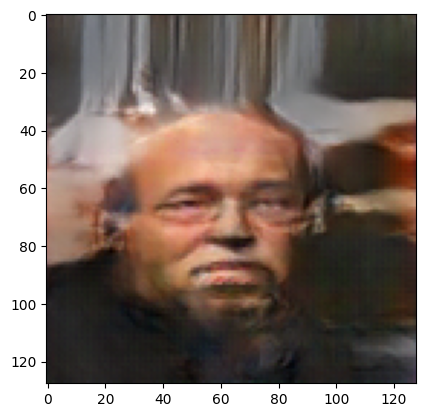

In [33]:
generator.eval()
test_image = generator(test_noise, test_embeddings).detach().cpu()
show_grid(torchvision.utils.make_grid(test_image, normalize=True, nrow=1))

In [34]:
test_noise = torch.randn(size=(1, cfg.noise_size)).cuda()
test_embeddings = sentence_encoder.convert_text_to_embeddings(['The female has pretty high cheekbones and an oval face. Her hair is black. She has a slightly open mouth and a pointy nose. The female is smiling, looks attractive and has heavy makeup. She is wearing earrings and lipstick.'])

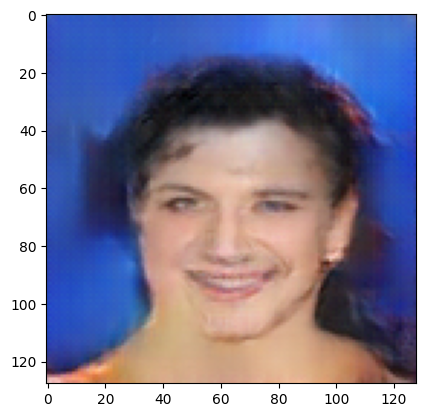

In [35]:
test_image = generator(test_noise, test_embeddings).detach().cpu()
show_grid(torchvision.utils.make_grid(test_image, normalize=True, nrow=1))

In [36]:
test_noise = torch.randn(size=(1, cfg.noise_size)).cuda()
test_embeddings = sentence_encoder.convert_text_to_embeddings(['He wears a 5 o clock shadow. His hair is brown and straight. He has a slightly open mouth and a pointy nose. He looks attractive and young is smiling. He is wearing a necktie.'])

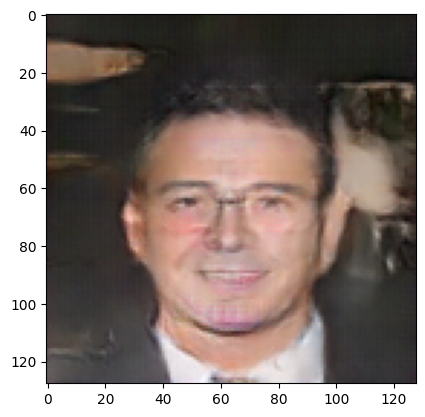

In [37]:
test_image = generator(test_noise, test_embeddings).detach().cpu()
show_grid(torchvision.utils.make_grid(test_image, normalize=True, nrow=1))

In [38]:
test_noise = torch.randn(size=(1, cfg.noise_size)).cuda()
test_embeddings = sentence_encoder.convert_text_to_embeddings(['he female has high cheekbones and an oval face. She has arched eyebrows, big lips, a slightly open mouth and a pointy nose. The woman looks attractive, young, is smiling, has heavy makeup and rosy cheeks. She is wearing earrings and lipstick.'])

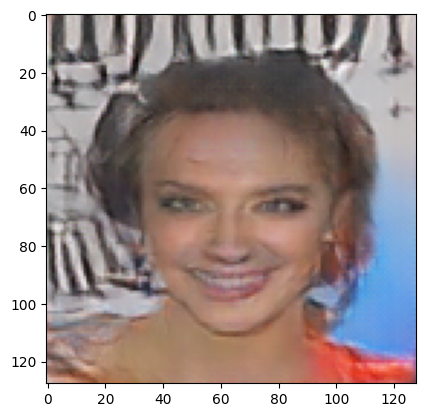

In [39]:
test_image = generator(test_noise, test_embeddings).detach().cpu()
show_grid(torchvision.utils.make_grid(test_image, normalize=True, nrow=1))

In [40]:
test_noise = torch.randn(size=(1, cfg.noise_size)).cuda()
test_embeddings = sentence_encoder.convert_text_to_embeddings(['The gentleman looks chubby. He sports a goatee and has sideburns. He has black hair. He has a slightly open mouth and narrow eyes. The male is young.'])

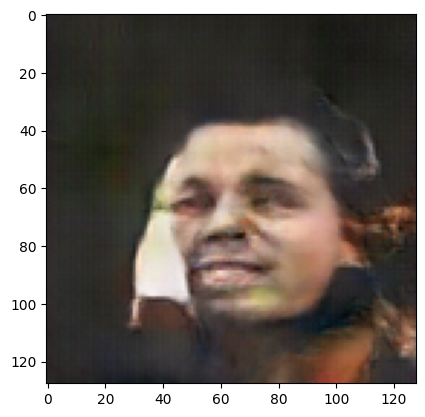

In [41]:
test_image = generator(test_noise, test_embeddings).detach().cpu()
show_grid(torchvision.utils.make_grid(test_image, normalize=True, nrow=1))

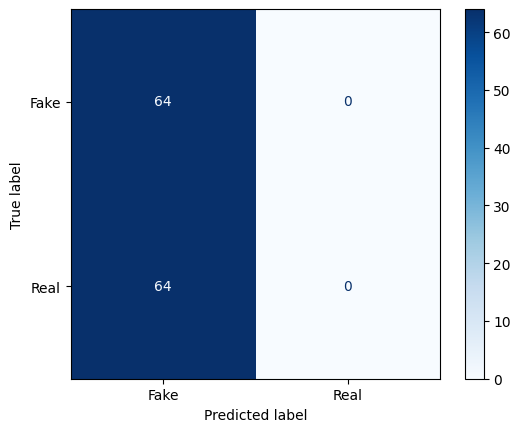

In [54]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.datasets as dset
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Define the make_conv function (as previously defined)
def make_conv(in_channels, out_channels, kernel_size, stride=2, padding=1, batch_norm=True):
    layers = []
    layers.append(nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding, bias=False))
    if batch_norm:
        layers.append(nn.BatchNorm2d(out_channels))
    return nn.Sequential(*layers)

# Define your Discriminator class (as previously defined)
class Discriminator(nn.Module):
    def __init__(self, conv_dim):
        super(Discriminator, self).__init__()
        self.conv_dim = conv_dim
        self.conv1 = make_conv(3, conv_dim, 4, batch_norm=False)
        self.conv2 = make_conv(conv_dim, conv_dim*2, 4)
        self.conv3 = make_conv(conv_dim*2, conv_dim*4, 4)
        self.conv4 = make_conv(conv_dim*4, conv_dim*8, 4)
        self.fc = nn.Linear(conv_dim*8*2*2, 1)
        
    def forward(self, x):
        out = F.leaky_relu(self.conv1(x), 0.2)
        out = F.leaky_relu(self.conv2(out), 0.2)
        out = F.leaky_relu(self.conv3(out), 0.2)
        out = F.leaky_relu(self.conv4(out), 0.2)
        out = out.view(-1, self.conv_dim*8*2*2)
        out = self.fc(out)
        return out

# Function to get dataloader
def get_dataloader(batch_size, image_size, data_dir='C:/Users/nunna/Downloads/Telegram Desktop/FaceGeneration-main 2/FaceGeneration-main/dataset'):
    dataset = dset.ImageFolder(root=data_dir,
                               transform=transforms.Compose([
                                   transforms.Resize(image_size),
                                   transforms.ToTensor(),
                               ]))
    data_loader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, shuffle=True)
    return data_loader

# Parameters
batch_size = 64
img_size = 32

# Get the dataloader
celeba_train_loader = get_dataloader(batch_size, img_size)

# Instantiate the discriminator
conv_dim = 64  # example value, change as needed
discriminator = Discriminator(conv_dim)
discriminator.eval()  # set to evaluation mode

# Generate a batch of real images
dataiter = iter(celeba_train_loader)
real_images, _ = next(dataiter)

# Generate a batch of fake images (example using random noise, replace with your generator output)
fake_images = torch.randn(batch_size, 3, img_size, img_size)

# Get discriminator predictions
real_preds = discriminator(real_images)
fake_preds = discriminator(fake_images)

# Convert predictions to binary (0 for fake, 1 for real)
real_preds = (real_preds > 0.5).float()
fake_preds = (fake_preds > 0.5).float()

# Actual labels (1 for real, 0 for fake)
real_labels = torch.ones(batch_size)
fake_labels = torch.zeros(batch_size)

# Combine predictions and labels
all_preds = torch.cat((real_preds, fake_preds))
all_labels = torch.cat((real_labels, fake_labels))

# Compute confusion matrix
cm = confusion_matrix(all_labels.numpy(), all_preds.numpy())
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Fake', 'Real'])

# Display confusion matrix
disp.plot(cmap=plt.cm.Blues)
plt.show()


In [42]:
test_noise = torch.randn(size=(1, cfg.noise_size)).cuda()
test_embeddings = sentence_encoder.convert_text_to_embeddings(['She has arched eyebrows, big lips and a slightly open mouth. She is wearing earrings and lipstick. Her hair is brown and wavy. The female seems attractive, young and has heavy makeup.'])

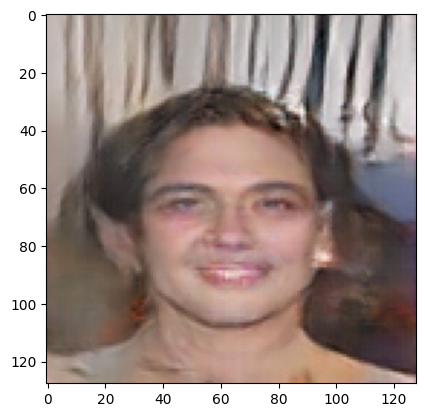

In [43]:
test_image = generator(test_noise, test_embeddings).detach().cpu()
show_grid(torchvision.utils.make_grid(test_image, normalize=True, nrow=1))

In [45]:
def get_dataloader(batch_size, image_size, data_dir='img_align_celeba/img_align_celeba'):
    """
    Batch the neural network data using DataLoader
    :param batch_size: The size of each batch; the number of images in a batch
    :param img_size: The square size of the image data (x, y)
    :param data_dir: Directory where image data is located
    :return: DataLoader with batched data
    """
    dataset = dset.ImageFolder(root=data_dir,
                               transform=transforms.Compose([
                                   transforms.Resize(image_size),
                                   transforms.ToTensor(),
                               ]))
    
    data_loader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True)
    
    return data_loader

In [ ]:
import torch
import torchvision.datasets as dset
import torchvision.transforms as transforms

def get_dataloader(batch_size, image_size, data_dir='C:/Users/nunna/Downloads/Telegram Desktop/FaceGeneration-main 2/FaceGeneration-main/img_align_celeba'):
    """
    Batch the neural network data using DataLoader
    :param batch_size: The size of each batch; the number of images in a batch
    :param image_size: The input size of each image
    :param data_dir: The directory where the dataset is located
    :return: DataLoader with batched data
    """
    dataset = dset.ImageFolder(root=data_dir,
                               transform=transforms.Compose([
                                   transforms.Resize(image_size),
                                   transforms.ToTensor(),
                               ]))

    data_loader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                          shuffle=True)
    
    return data_loader

# Parameters
batch_size = 64
img_size = 32

# Call the function and get a dataloader
celeba_train_loader = get_dataloader(batch_size, img_size)


In [ ]:
!pip install opencv-python

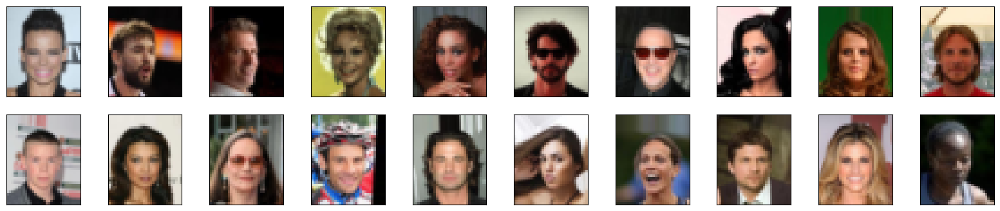

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Obtain one batch of training images
dataiter = iter(celeba_train_loader)
images, _ = next(dataiter)  # _ for no labels

# Plot the images in the batch
fig = plt.figure(figsize=(20, 4))
plot_size = 20
for idx in np.arange(plot_size):
    ax = fig.add_subplot(2, plot_size // 2, idx + 1, xticks=[], yticks=[])
    # Convert tensor to numpy array and transpose dimensions from (C, H, W) to (H, W, C)
    image_np = np.transpose(images[idx].numpy(), (1, 2, 0))
    ax.imshow(image_np)

# Show the plot
plt.show()


In [ ]:

def scale(x, feature_range=(-1, 1)):
    ''' Scale takes in an image x and returns that image, scaled
       with a feature_range of pixel values from -1 to 1. 
       This function assumes that the input x is already scaled from 0-1.'''
    # assume x is scaled to (0, 1)
    # scale to feature_range and return scaled x
    
    return x * (feature_range[1] - feature_range[0]) + feature_range[0]

In [ ]:
# check scaled range
# should be close to -1 to 1
img = images[0]
scaled_img = scale(img)

print('Min: ', scaled_img.min())
print('Max: ', scaled_img.max())

Min:  tensor(-0.8353)
Max:  tensor(0.9216)


In [ ]:

import torch.nn as nn
import torch.nn.functional as F

In [ ]:
# This cell contain a helper function
def make_conv(in_channels, out_channels, kernel_size, stride=2, padding=1, batch_norm=True):
    """
    Creates a convolutional layer, with optional batch normalization.
    INPUT :
        in_channels (int) : the number of the channels of the input image
        out_channels (int) :the number of channels of the output (result of the convolution)
        kernel_size (int or tuple) : the size of the convoluting kernel
        stride OPTIONAL (int) : the convolution's stride
        padding OPTIONAL (int) : one-padding added in the both sides of the input
        batch_norm OPTIONAL (boolean) : add/ or not a batch normalization layer
    OUTPUT:
        convolutional layer with/or without a batch norm layer in a sequential container
    """
    
    layers=[]
    conv_layer = nn.Conv2d(in_channels, out_channels,
                          kernel_size, stride, padding, bias=False)
    
    # append conv layer
    layers.append(conv_layer)
    # if batch norm set to True add a batch norm layer
    if batch_norm:
        layers.append(nn.BatchNorm2d(out_channels))
    
   
    return nn.Sequential(*layers)

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.datasets as dset
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import numpy as np

# Define your Discriminator class
class Discriminator(nn.Module):

    def __init__(self, conv_dim):
        super(Discriminator, self).__init__()
        self.conv_dim = conv_dim
        self.conv1 = make_conv(3, conv_dim, 4, batch_norm=False)
        self.conv2 = make_conv(conv_dim, conv_dim*2, 4)
        self.conv3 = make_conv(conv_dim*2, conv_dim*4, 4)
        self.conv4 = make_conv(conv_dim*4, conv_dim*8, 4)
        self.fc = nn.Linear(conv_dim*8*2*2, 1)
        
    def forward(self, x):
        out = F.leaky_relu(self.conv1(x), 0.2)
        out = F.leaky_relu(self.conv2(out), 0.2)
        out = F.leaky_relu(self.conv3(out), 0.2)
        out = F.leaky_relu(self.conv4(out), 0.2)
        out = out.view(-1, self.conv_dim*8*2*2)
        out = self.fc(out)
        return out

# Define the make_conv function
def make_conv(in_channels, out_channels, kernel_size, stride=2, padding=1, batch_norm=True):
    layers = []
    layers.append(nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding, bias=False))
    if batch_norm:
        layers.append(nn.BatchNorm2d(out_channels))
    return nn.Sequential(*layers)

# Import the custom tests module
import tests

# Test the Discriminator
tests.test_discriminator(Discriminator)


ModuleNotFoundError: No module named 'tests'

In [ ]:
#This cell is for a helper function 
def make_tconv(in_channels, out_channels, kernel_size, stride=2, padding=1, batch_norm=True):
    """
    Creates a transposed convolutional layer, with optional batch normalization.
    INPUT :
        in_channels (int) : the number of the channels of the input image
        out_channels (int) :the number of channels of the output (result of the convolution)
        kernel_size (int or tuple) : the size of the convoluting kernel
        stride OPTIONAL (int) : the convolution's stride
        padding OPTIONAL (int) : one-padding added in the both sides of the input
        batch_norm OPTIONAL (boolean) : add/ or not a batch normalization layer
    OUTPUT:
        transposed convolutional layer with/or without a batch norm layer in a sequential container
    """
    
    layers=[]
    transpose_conv_layer = nn.ConvTranspose2d(in_channels, out_channels,
                                             kernel_size, stride, padding, bias=False)
    
    # append transpose convolutional layer
    layers.append(transpose_conv_layer)
    
    if batch_norm:
        layers.append(nn.BatchNorm2d(out_channels))
    
    return nn.Sequential(*layers)


In [ ]:
class Generator(nn.Module):
    
    def __init__(self, z_size, conv_dim):
        """
        Initialize the Generator Module
        :param z_size: The length of the input latent vector, z
        :param conv_dim: The depth of the inputs to the *last* transpose convolutional layer
        """
        super(Generator, self).__init__()
        
        self.conv_dim = conv_dim
        # layers 
        # first convolutional layer : input 2 x 2  
        self.tconv1 = make_tconv(conv_dim*8, conv_dim*4, 4)
        #second convolutional layer : input 4 x 4  
        self.tconv2 = make_tconv(conv_dim*4, conv_dim*2, 4)
        # third convolutional layer : input 8 x 8 
        self.tconv3 = make_tconv(conv_dim*2, conv_dim, 4)
        # last convolutional layer : output 32 x 32 x 3 
        self.tconv4 = make_tconv(conv_dim, 3, 4, batch_norm=False)
        
        
        self.fc = nn.Linear(z_size, conv_dim*8*2*2)

        # complete init function
        

    def forward(self, x):
        """
        Forward propagation of the neural network
        :param x: The input to the neural network     
        :return: A 32x32x3 Tensor image as output
        """
        # fully-connected + reshape 
        out = self.fc(x)
        out = out.view(-1, self.conv_dim*8, 2, 2) # (batch_size, depth, 4, 4)
        
        # hidden transpose conv layers + relu
        out = F.relu(self.tconv1(out))
        out = F.relu(self.tconv2(out))
        out = F.relu(self.tconv3(out))
        
        # last layer 
        out = self.tconv4(out)
        # apply tanh activation
        out = torch.tanh(out)
        
        return out

tests.test_generator(Generator)

NameError: name 'tests' is not defined

In [ ]:

def weights_init_normal(m):
    """
    Applies initial weights to certain layers in a model .
    The weights are taken from a normal distribution 
    with mean = 0, std dev = 0.02.
    :param m: A module or layer in a network    
    """
    # get the class name to ensure that we initialise only for convolutional and linear layers
    class_name = m.__class__.__name__
    
    if hasattr(m, 'weight') and (class_name.find('Conv') != -1 or class_name.find('Linear') != -1):
        m.weight.data.normal_(0.0, 0.02)
        
        # set the bias term to 0 if it exists 
        if hasattr(m, 'bias') and m.bias is not None:
            m.bias.data.zero_()
    

In [ ]:
def build_network(d_conv_dim, g_conv_dim, z_size):
    # define discriminator and generator
    D = Discriminator(d_conv_dim)
    G = Generator(z_size=z_size, conv_dim=g_conv_dim)

    return D,G

    # initialize model  

In [ ]:

# Define model hyperparams
d_conv_dim = 128
g_conv_dim = 128
z_size = 100

D, G = build_network(d_conv_dim, g_conv_dim, z_size)

In [ ]:

import torch

# Check for a GPU
train_on_gpu = torch.cuda.is_available()
if not train_on_gpu:
    print('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Training on GPU!')

Training on GPU!


In [ ]:
def real_loss(D_out):
    '''Calculates how close discriminator outputs are to being real.
       param, D_out: discriminator logits
       return: real loss'''
    batch_size = D_out.size(0)
    labels = torch.ones(batch_size)*0.9 # performed smoothing 
    
    if train_on_gpu:
        labels = labels.cuda()
        
    criterion = nn.BCEWithLogitsLoss()
    loss = criterion(D_out.squeeze(),labels)
    return loss

def fake_loss(D_out):
    '''Calculates how close discriminator outputs are to being fake.
       param, D_out: discriminator logits
       return: fake loss'''
    batch_size = D_out.size(0)
    labels = torch.zeros(batch_size) # fake images 
    
    if train_on_gpu:
        labels = labels.cuda()
        
    criterion = nn.BCEWithLogitsLoss()
    loss = criterion(D_out.squeeze(),labels)
    return loss

In [ ]:
import torch.optim as optim

# Create optimizers for the discriminator D and generator G

d_lr = 0.0002 
g_lr = 0.0004 
d_optimizer = optim.Adam(D.parameters(),d_lr, betas=(0.2, 0.999))
g_optimizer = optim.Adam(G.parameters(),g_lr, betas=(0.2, 0.999))

In [ ]:
def train(D, G, n_epochs, print_every=50):
    '''Trains adversarial networks for some number of epochs
       param, D: the discriminator network
       param, G: the generator network
       param, n_epochs: number of epochs to train for
       param, print_every: when to print and record the models' losses
       return: D and G losses'''
    
    # move models to GPU
    if train_on_gpu:
        D.cuda()
        G.cuda()

    # keep track of loss and generated, "fake" samples
    samples = []
    losses = []

    # Get some fixed data for sampling. These are images that are held
    # constant throughout training, and allow us to inspect the model's performance
    sample_size=16
    fixed_z = np.random.uniform(-1, 1, size=(sample_size, z_size))
    fixed_z = torch.from_numpy(fixed_z).float()
    # move z to GPU if available
    if train_on_gpu:
        fixed_z = fixed_z.cuda()

    # epoch training loop
    for epoch in range(n_epochs):

        # batch training loop
        for batch_i, (real_images, _) in enumerate(celeba_train_loader):

            batch_size = real_images.size(0)
            real_images = scale(real_images)

            
            # 1. Train the discriminator on real and fake images
            d_optimizer.zero_grad()
            
            if train_on_gpu:
                real_images = real_images.cuda()
            
            # loss on real images 
            d_real = D(real_images)
            d_real_loss = real_loss(d_real)
            
            #train with fake images
            z = np.random.uniform(-1, 1, size=(batch_size, z_size))
            z = torch.from_numpy(z).float()
            
            if train_on_gpu:
                z = z.cuda()
                
            fake_images = G(z)
            
            # loss on fake images
            d_fake = D(fake_images)
            d_fake_loss = fake_loss(d_fake)
            
            # backprop
            d_loss = d_real_loss + d_fake_loss
            d_loss.backward()
            d_optimizer.step()

            # 2. Train the generator with an adversarial loss
            g_optimizer.zero_grad()
            
            # Generate fake images 
            z = np.random.uniform(-1, 1, size=(batch_size, z_size))
            z = torch.from_numpy(z).float()
            
            if train_on_gpu:
                z = z.cuda()
                
            fake_images = G(z)
            d_fake = D(fake_images)
            g_loss = real_loss(d_fake)
            
            # perfom backprop
            g_loss.backward()
            g_optimizer.step()
         

            # Print some loss stats
            if batch_i % print_every == 0:
                # append discriminator loss and generator loss
                losses.append((d_loss.item(), g_loss.item()))
                # print discriminator and generator loss
                print('Epoch [{:5d}/{:5d}] | d_loss: {:6.4f} | g_loss: {:6.4f}'.format(
                        epoch+1, n_epochs, d_loss.item(), g_loss.item()))


        ## AFTER EACH EPOCH##    
        # this code assumes your generator is named G, feel free to change the name
        # generate and save sample, fake images
        G.eval() # for generating samples
        samples_z = G(fixed_z)
        samples.append(samples_z)
        G.train() # back to training mode

    # Save training generator samples
    with open('train_samples.pkl', 'wb') as f:
        pkl.dump(samples, f)
    
    # finally return losses
    return losses

In [ ]:
# torch.cuda.synchronize()

CUDA_LAUNCH_BLOCKING=1
# set number of epochs 
n_epochs = 10

# call training function

losses = train(D, G, n_epochs=n_epochs)

RuntimeError: CUDA error: unknown error
CUDA kernel errors might be asynchronously reported at some other API call, so the stacktrace below might be incorrect.
For debugging consider passing CUDA_LAUNCH_BLOCKING=1.
Compile with `TORCH_USE_CUDA_DSA` to enable device-side assertions.


In [ ]:
pip install transformers

In [ ]:
from transformers import BertTokenizer, BertModel
import torch

class TextEncoder(nn.Module):
    def __init__(self, hidden_size):
        super(TextEncoder, self).__init__()
        self.bert = BertModel.from_pretrained('bert-base-uncased')
        self.fc = nn.Linear(self.bert.config.hidden_size, hidden_size)

    def forward(self, text):
        # Get BERT embeddings
        with torch.no_grad():
            outputs = self.bert(text)
            hidden_states = outputs.last_hidden_state
            # Use the [CLS] token embedding
            cls_embedding = hidden_states[:, 0, :]
        # Project to the desired size
        return self.fc(cls_embedding)

# Example usage
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
text_encoder = TextEncoder(hidden_size=z_size)  # Match z_size with the generator's input

text = ["a picture of a cat"]
tokens = tokenizer(text, return_tensors='pt', padding=True, truncation=True)
text_embeddings = text_encoder(tokens['input_ids'])

In [ ]:
class Generator(nn.Module):
    def __init__(self, z_size, conv_dim):
        super(Generator, self).__init__()
        self.conv_dim = conv_dim
        self.fc = nn.Linear(z_size + hidden_size, conv_dim*8*2*2)  # Add text embedding size

        self.tconv1 = make_tconv(conv_dim*8, conv_dim*4, 4)
        self.tconv2 = make_tconv(conv_dim*4, conv_dim*2, 4)
        self.tconv3 = make_tconv(conv_dim*2, conv_dim, 4)
        self.tconv4 = make_tconv(conv_dim, 3, 4, batch_norm=False)

    def forward(self, z, text_embedding):
        # Combine z and text embedding
        z_combined = torch.cat([z, text_embedding], dim=1)
        out = self.fc(z_combined)
        out = out.view(-1, self.conv_dim*8, 2, 2)
        out = F.relu(self.tconv1(out))
        out = F.relu(self.tconv2(out))
        out = F.relu(self.tconv3(out))
        out = self.tconv4(out)
        out = torch.tanh(out)
        return out


In [ ]:
def train(D, G, text_encoder, n_epochs, print_every=50):
    if train_on_gpu:
        D.cuda()
        G.cuda()
        text_encoder.cuda()

    samples = []
    losses = []

    sample_size = 16
    fixed_z = np.random.uniform(-1, 1, size=(sample_size, z_size))
    fixed_z = torch.from_numpy(fixed_z).float()
    if train_on_gpu:
        fixed_z = fixed_z.cuda()

    text = ["a picture of a cat"] * sample_size
    tokens = tokenizer(text, return_tensors='pt', padding=True, truncation=True)
    fixed_text_embeddings = text_encoder(tokens['input_ids'])
    if train_on_gpu:
        fixed_text_embeddings = fixed_text_embeddings.cuda()

    for epoch in range(n_epochs):
        for batch_i, (real_images, _) in enumerate(celeba_train_loader):
            batch_size = real_images.size(0)
            real_images = scale(real_images)

            d_optimizer.zero_grad()
            if train_on_gpu:
                real_images = real_images.cuda()

            d_real = D(real_images)
            d_real_loss = real_loss(d_real)

            z = np.random.uniform(-1, 1, size=(batch_size, z_size))
            z = torch.from_numpy(z).float()
            if train_on_gpu:
                z = z.cuda()

            text = ["a picture of a cat"] * batch_size
            tokens = tokenizer(text, return_tensors='pt', padding=True, truncation=True)
            text_embeddings = text_encoder(tokens['input_ids'])
            if train_on_gpu:
                text_embeddings = text_embeddings.cuda()

            fake_images = G(z, text_embeddings)
            d_fake = D(fake_images)
            d_fake_loss = fake_loss(d_fake)

            d_loss = d_real_loss + d_fake_loss
            d_loss.backward()
            d_optimizer.step()

            g_optimizer.zero_grad()
            z = np.random.uniform(-1, 1, size=(batch_size, z_size))
            z = torch.from_numpy(z).float()
            if train_on_gpu:
                z = z.cuda()

            text = ["a picture of a cat"] * batch_size
            tokens = tokenizer(text, return_tensors='pt', padding=True, truncation=True)
            text_embeddings = text_encoder(tokens['input_ids'])
            if train_on_gpu:
                text_embeddings = text_embeddings.cuda()

            fake_images = G(z, text_embeddings)
            d_fake = D(fake_images)
            g_loss = real_loss(d_fake)

            g_loss.backward()
            g_optimizer.step()

            if batch_i % print_every == 0:
                losses.append((d_loss.item(), g_loss.item()))
                print('Epoch [{:5d}/{:5d}] | d_loss: {:6.4f} | g_loss: {:6.4f}'.format(
                        epoch+1, n_epochs, d_loss.item(), g_loss.item()))

        G.eval()
        samples_z = G(fixed_z, fixed_text_embeddings)
        samples.append(samples_z)
        G.train()

    with open('train_samples.pkl', 'wb') as f:
        pkl.dump(samples, f)

    return losses


In [ ]:
from torch.utils.data import DataLoader

# Define your dataset class
class ImageTextDataset('C:/Users/nunna/Downloads/Telegram Desktop/FaceGeneration-main 2/FaceGeneration-main/text_5_descr_celeba.csv'):
    def __init__(self, image_dir, description_file, transform=None):
        self.image_dir = image_dir
        self.transform = transform
        with open(description_file, 'r') as file:
            self.descriptions = [line.strip() for line in file.readlines()]
        self.image_files = [f for f in os.listdir(image_dir) if os.path.isfile(os.path.join(image_dir, f))]
    
    def __len__(self):
        return len(self.image_files)
    
    def __getitem__(self, idx):
        img_name = os.path.join(self.image_dir, self.image_files[idx])
        image = Image.open(img_name)
        if self.transform:
            image = self.transform(image)
        
        description = self.descriptions[idx]
        return image, description

# Create the dataloader
def get_dataloader(batch_size, image_size, image_dir, description_file):
    transform = transforms.Compose([
        transforms.Resize((image_size, image_size)),
        transforms.ToTensor(),
        transforms.Normalize((0.5,), (0.5,))
    ])
    
    dataset = ImageTextDataset(image_dir=image_dir, description_file=description_file, transform=transform)
    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)
    return dataloader

# Define hyperparameters
batch_size = 64
image_size = 128
n_epochs = 5
train_on_gpu = torch.cuda.is_available()
z_size = 100

# Create the dataloader
celeba_train_loader = get_dataloader(batch_size, image_size, image_dir='C:/Users/nunna/Downloads/Telegram Desktop/FaceGeneration-main 2/FaceGeneration-main/img_align_celeba', description_file="C:/Users/nunna/Downloads/Telegram Desktop/FaceGeneration-main 2/FaceGeneration-main/text_5_descr_celeba.csv")

# Train the GAN
losses = train(D, G, text_encoder, tokenizer, celeba_train_loader, n_epochs)


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import pandas as pd
import pickle as pkl
import os
from torch.utils.data import DataLoader
from transformers import BertTokenizer, BertModel
from torchvision import transforms
from PIL import Image

class Generator(nn.Module):
    def __init__(self, z_size, embedding_size):
        super(Generator, self).__init__()
        self.fc1 = nn.Linear(z_size + embedding_size, 256)
        self.fc2 = nn.Linear(256, 512)
        self.fc3 = nn.Linear(512, 1024)
        self.fc4 = nn.Linear(1024, 64 * 64 * 3)
        self.relu = nn.ReLU()

    def forward(self, z, text_embeddings):
        x = torch.cat((z, text_embeddings), dim=1)
        x = self.relu(self.fc1(x))
        x = self.relu(self.fc2(x))
        x = self.relu(self.fc3(x))
        x = torch.tanh(self.fc4(x))
        x = x.view(-1, 3, 64, 64)
        return x

class Discriminator(nn.Module):
    def __init__(self, conv_dim):
        super(Discriminator, self).__init__()
        self.conv1 = nn.Conv2d(3, conv_dim, 4, stride=2, padding=1)  # (B, conv_dim, 32, 32)
        self.conv2 = nn.Conv2d(conv_dim, conv_dim * 2, 4, stride=2, padding=1)  # (B, conv_dim * 2, 16, 16)
        self.conv3 = nn.Conv2d(conv_dim * 2, conv_dim * 4, 4, stride=2, padding=1)  # (B, conv_dim * 4, 8, 8)
        self.conv4 = nn.Conv2d(conv_dim * 4, conv_dim * 8, 4, stride=2, padding=1)  # (B, conv_dim * 8, 4, 4)
        self.fc1 = nn.Linear(conv_dim * 8 * 4 * 4, 1)  # (B, 1)
        self.leaky_relu = nn.LeakyReLU(0.2)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        x = self.leaky_relu(self.conv1(x))
        x = self.leaky_relu(self.conv2(x))
        x = self.leaky_relu(self.conv3(x))
        x = self.leaky_relu(self.conv4(x))
        x = x.view(x.size(0), -1)  # Flatten the feature map
        x = self.fc1(x)
        return self.sigmoid(x)

def real_loss(D_out):
    return nn.BCELoss()(D_out, torch.ones_like(D_out))

def fake_loss(D_out):
    return nn.BCELoss()(D_out, torch.zeros_like(D_out))

class ImageTextDataset(torch.utils.data.Dataset):
    def __init__(self, image_folder, annotations_file, transform=None):
        self.image_folder = image_folder
        self.annotations = pd.read_csv(annotations_file)
        self.transform = transform

    def __len__(self):
        return len(self.annotations)

    def __getitem__(self, idx):
        img_name = os.path.join(self.image_folder, self.annotations.iloc[idx, 0])
        image = Image.open(img_name).convert("RGB")
        if self.transform:
            image = self.transform(image)
        text_description = self.annotations.iloc[idx, 1]
        return image, text_description

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyperparameters
batch_size = 64
z_size = 100
embedding_size = 128
sample_size = 16
n_epochs = 100
print_every = 100

# Data preparation
image_folder = 'C:/Users/nunna/Downloads/Telegram Desktop/FaceGeneration-main 2/FaceGeneration-main/dataset/img_align_celeba'
annotations_file = 'C:/Users/nunna/Downloads/Telegram Desktop/FaceGeneration-main 2/FaceGeneration-main/dataset/text_descr_celeba.csv'
transform = transforms.Compose([transforms.Resize(64), transforms.ToTensor()])
celeba_dataset = ImageTextDataset(image_folder, annotations_file, transform=transform)
celeba_train_loader = DataLoader(celeba_dataset, batch_size=batch_size, shuffle=True)

# Model initialization
G = Generator(z_size, embedding_size).to(device)
D = Discriminator(64).to(device)
g_optimizer = optim.Adam(G.parameters(), lr=0.0002, betas=(0.5, 0.999))
d_optimizer = optim.Adam(D.parameters(), lr=0.0002, betas=(0.5, 0.999))
criterion = nn.BCELoss()

# BERT tokenizer and model
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
text_encoder = BertModel.from_pretrained('bert-base-uncased').to(device)
projection_layer = nn.Linear(768, embedding_size).to(device)

# Fixed input for generating samples
fixed_z = np.random.uniform(-1, 1, size=(sample_size, z_size))
fixed_z = torch.from_numpy(fixed_z).float().to(device)

# Training loop
samples = []
for epoch in range(n_epochs):
    for batch_i, (real_images, text_descriptions) in enumerate(celeba_train_loader):
        batch_size = real_images.size(0)
        real_images = real_images.to(device)

        # Train Discriminator
        d_optimizer.zero_grad()

        # Real images
        d_real = D(real_images)
        d_real_loss = real_loss(d_real)

        # Fake images
        z = np.random.uniform(-1, 1, size=(batch_size, z_size))
        z = torch.from_numpy(z).float().to(device)

        tokens = tokenizer(text_descriptions, return_tensors='pt', padding=True, truncation=True)
        text_embeddings = text_encoder(tokens['input_ids'].to(device))[0].mean(dim=1)
        projected_embeddings = projection_layer(text_embeddings)
        z_text_combined = torch.cat((z, projected_embeddings), dim=1)

        fake_images = G(z_text_combined)
        d_fake = D(fake_images)
        d_fake_loss = fake_loss(d_fake)

        d_loss = d_real_loss + d_fake_loss
        d_loss.backward()
        d_optimizer.step()

        # Train Generator
        g_optimizer.zero_grad()
        z = np.random.uniform(-1, 1, size=(batch_size, z_size))
        z = torch.from_numpy(z).float().to(device)

        tokens = tokenizer(text_descriptions, return_tensors='pt', padding=True, truncation=True)
        text_embeddings = text_encoder(tokens['input_ids'].to(device))[0].mean(dim=1)
        projected_embeddings = projection_layer(text_embeddings)
        z_text_combined = torch.cat((z, projected_embeddings), dim=1)

        fake_images = G(z_text_combined)
        d_fake = D(fake_images)
        g_loss = real_loss(d_fake)

        g_loss.backward()
        g_optimizer.step()

        if batch_i % print_every == 0:
            print('Epoch [{:5d}/{:5d}] | d_loss: {:6.4f} | g_loss: {:6.4f}'.format(
                epoch+1, n_epochs, d_loss.item(), g_loss.item()))

    # Generate samples
    G.eval()
    fixed_text_descriptions = ["a sample text description"] * sample_size
    tokens = tokenizer(fixed_text_descriptions, return_tensors='pt', padding=True, truncation=True)
    fixed_text_embeddings = text_encoder(tokens['input_ids'].to(device))[0].mean(dim=1)
    projected_embeddings = projection_layer(fixed_text_embeddings)

    samples_z = G(torch.cat((fixed_z, projected_embeddings), dim=1))
    samples.append(samples_z.cpu().detach())
    G.train()

with open('train_samples.pkl', 'wb') as f:
    pkl.dump(samples, f)

print("Training completed.")
